In [3]:
DATOS_DIR = 'C:/Users/Peter/Desktop/all/Facu/Mineria De Datos Usando Sistemas Inteligentes/Datos/'  

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

In [6]:
df = pd.read_csv(DATOS_DIR + 'automobile.csv')
df.head()

,Normalized-losses,Make,Fuel-type,Aspiration,Num-of-doors,Body-style,Drive-wheels,Engine-location,Wheel-base,Length,...,Fuel-system,Bore,Stroke,Compression-ratio,Horsepower,Peak-rpm,City-mpg,Highway-mpg,Price,Symboling
0,168.0,toyota,gas,std,two,sedan,rwd,front,94.5,168.7,...,2bbl,3.19,3.03,9.0,70.0,4800.0,29,34,8058.0,1
1,113.0,mazda,gas,std,four,sedan,fwd,front,93.1,166.8,...,2bbl,3.08,3.15,9.0,68.0,5000.0,31,38,7395.0,1
2,87.0,toyota,gas,std,two,hatchback,fwd,front,95.7,158.7,...,2bbl,3.05,3.03,9.0,62.0,4800.0,35,39,5348.0,1
3,125.0,mitsubishi,gas,std,four,sedan,fwd,front,96.3,172.4,...,2bbl,3.35,3.46,8.5,88.0,5000.0,25,32,6989.0,1
4,148.0,dodge,gas,turbo,NaN,sedan,fwd,front,93.7,157.3,...,mpfi,3.03,3.39,7.6,102.0,5500.0,24,30,8558.0,1


# Función para crear histogramas y gráficos de barras

In [7]:
def visualizar_dataset(df):
    # Histogramas para variables numéricas
    df.hist(figsize=(12, 10), bins=30)
    plt.tight_layout()
    plt.show()
    
    # Gráficos de barras para variables categóricas
    columnas_categoricas = df.select_dtypes(include=['object', 'category']).columns
    num_cols = len(columnas_categoricas)
    filas = (num_cols + 2) // 3  # Aproximadamente 3 gráficos por fila
    
    fig, axes = plt.subplots(filas, 3, figsize=(15, 3*filas))
    axes = axes.flatten()
    
    for i, col_name in enumerate(columnas_categoricas):
        if i < len(axes):
            df[col_name].value_counts().plot(kind='bar', ax=axes[i], title=col_name)
    
    # Ocultar ejes vacíos
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()

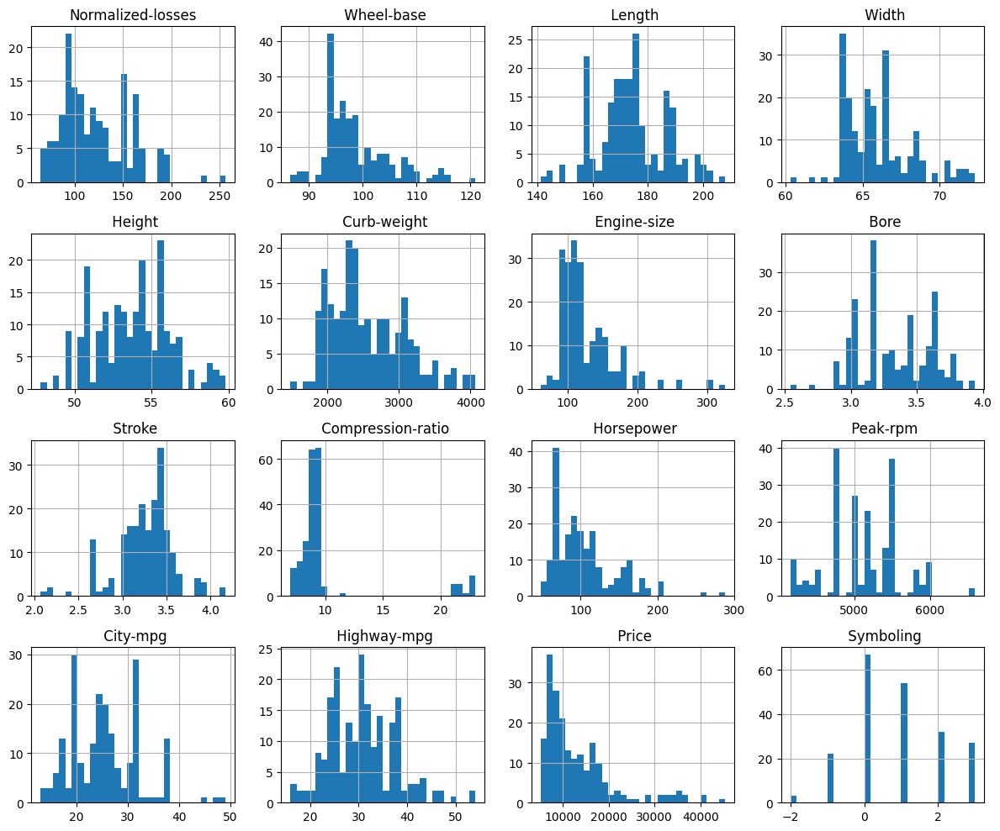

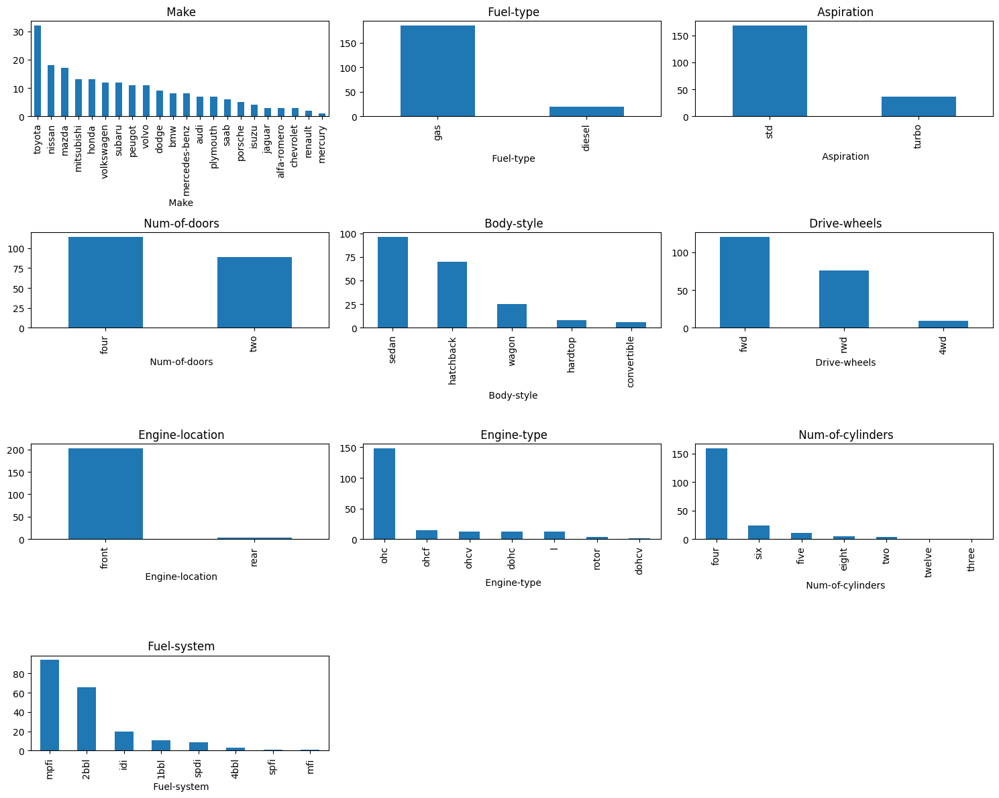

In [8]:
visualizar_dataset(df)

In [9]:
import seaborn as sns

def matriz_correlacion(df):
    plt.figure(figsize=(14, 12))
    corr = df.select_dtypes(include=['int64', 'float64']).corr()
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, square=True)
    plt.title("Matriz de Correlación de Variables Numéricas", fontsize=16)
    plt.tight_layout()
    plt.show()


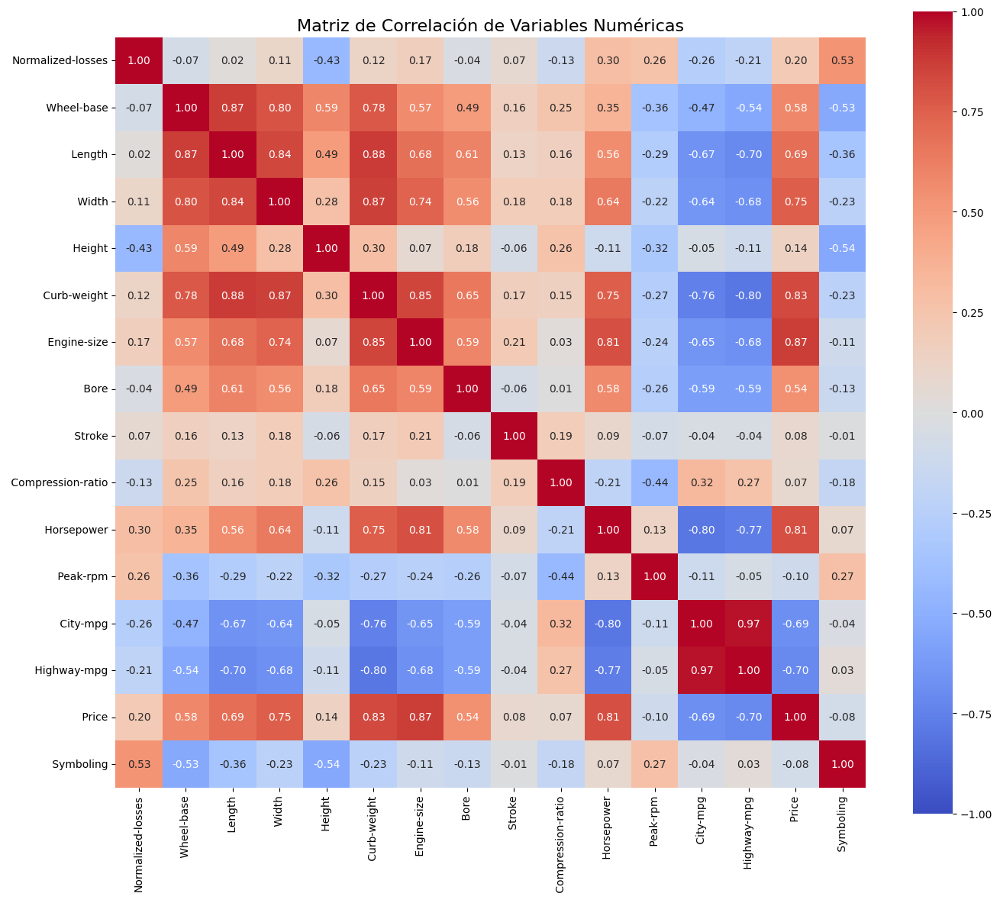

In [10]:
matriz_correlacion(df)

In [11]:
profile = ProfileReport(df, title="Reporte del Dataset Ej 1", explorative=True)
profile.to_notebook_iframe()  # si estás en Jupyter
profile.to_file("reporteEj1.html")  # o exportalo como HTML


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 26/26 [00:00<00:00, 1190.63it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Conclusiones:
- Creo que si el historiograma es muy similar tendremos correlacion lineal fuerte
- Historiograma para atributos numericos y diagrama de cajas para categoricos